<a href="https://colab.research.google.com/github/sanheensethi/gndcteam/blob/master/VisulizeFilters.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
 #Downloading Dataset
!git clone https://github.com/spMohanty/PlantVillage-Dataset

Cloning into 'PlantVillage-Dataset'...
remote: Enumerating objects: 163229, done.
remote: Total 163229 (delta 0), reused 0 (delta 0), pack-reused 163229
Receiving objects: 100% (163229/163229), 2.00 GiB | 26.91 MiB/s, done.
Resolving deltas: 100% (99/99), done.
Checking out files: 100% (182401/182401), done.


In [ ]:
 #copy the data
!cp -R /content/PlantVillage-Dataset/raw /content/

In [ ]:
 #for removing any folder
!rm -r /content/Test

rm: cannot remove '/content/Test': No such file or directory


In [ ]:
 #Inserting Libraries
import numpy as np
import random
import shutil
import pickle
import cv2
from os import listdir
from sklearn.preprocessing import LabelBinarizer
from keras.models import Sequential
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation, Flatten, Dropout, Dense
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.preprocessing import image
from keras.preprocessing.image import img_to_array
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

Using TensorFlow backend.


In [ ]:
 def TestFileFolderCreate() :   
    randomFolder = random.randint(0,len(root_dir))
    folderName = root_dir[randomFolder]
    print(folderName)
    imageList = listdir(f"{directory_root}/{folderName}")
    randomImageNum = random.randint(0,len(imageList))
    ImageName = imageList[randomImageNum]
    print(ImageName)
    WriteFile(folderName,ImageName)
    src = f"{directory_root}/{folderName}/{ImageName}"
    des = '/content/Test/'
    shutil.move(src,des)

In [ ]:
 #Initializing Variables
EPOCHS = 25
INIT_LR = 1e-4
BS = 32
default_image_size = tuple((256, 256))
image_size = 0
directory_root = '/content/raw/color'
width=256
height=256
depth=3

In [ ]:
 root_dir = listdir(directory_root)
print("Number Of Folders : " + str(len(root_dir)))

Number Of Folders : 38


In [ ]:
 !mkdir Test

In [ ]:
 def WriteFile(ClassName,ImageName):
    f = open("TestFile.csv","a+")
    f.write(ClassName+"@#"+ImageName+"\n")

In [ ]:
 for i in range(0,10):
    print(i)
    TestFileFolderCreate()

0
Tomato___Spider_mites Two-spotted_spider_mite
7c3b7797-2ca7-4c35-af30-ca0ca7217015___Com.G_SpM_FL 8830.JPG
1
Cherry_(including_sour)___healthy
a34f6c1e-7e15-4988-906d-47aa21d341c2___JR_HL 9822.JPG
2
Cherry_(including_sour)___Powdery_mildew
a59c1014-98e0-4cb6-8860-f0520fea6536___FREC_Pwd.M 4517.JPG
3
Tomato___Tomato_Yellow_Leaf_Curl_Virus
ee615249-0f00-47d7-b286-a0093eb97aa0___YLCV_GCREC 2255.JPG
4
Corn_(maize)___Common_rust_
RS_Rust 2077.JPG
5
Tomato___Late_blight
079f7695-a60e-4a35-a1f3-fbe71cf19126___GHLB2 Leaf 8783.JPG
6
Peach___Bacterial_spot
8fbc5547-f122-48a6-a715-4b2d904e3334___Rutg._Bact.S 2209.JPG
7
Tomato___healthy
23a4712e-8805-43f7-9ae4-655d1c4799b0___RS_HL 0619.JPG
8
Tomato___Tomato_mosaic_virus
f404ec4e-80d9-4392-900e-43a28f689145___PSU_CG 2323.JPG
9
Tomato___Spider_mites Two-spotted_spider_mite
5d41d1f6-6e1c-401c-9ac3-d81683ea1191___Com.G_SpM_FL 9030.JPG


[INFO] Loading Data 
Total Images : 54295


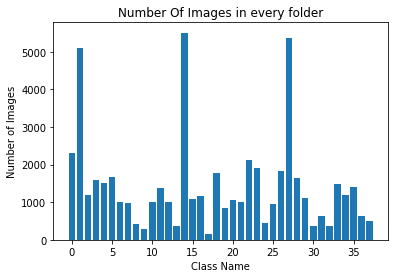

In [ ]:
 #Viewing Number of Images in Folder
print("[INFO] Loading Data ")
root_dir = listdir(directory_root)
sumP = 0
Y = []
for directory in root_dir :
    #print("[FOLDER] Loading Folder : "+str(directory))
    plant_disease_image_list = listdir(f"{directory_root}/{directory}")
    lenP = len(plant_disease_image_list)
    Y.append (lenP)
    #print("[IMAGES] Images : " + str(lenP))
    sumP += lenP
   
print("Total Images : " + str(sumP))
 
#BarGraph
plt.bar(range(0,len(root_dir)),Y)
plt.xlabel("Class Name")
plt.ylabel("Number of Images")
plt.title("Number Of Images in every folder")
plt.show()

In [ ]:
 dataGeneration = ImageDataGenerator(validation_split=0.2,rotation_range=25, width_shift_range=0.1,
    height_shift_range=0.1, shear_range=0.2, 
    zoom_range=0.5,horizontal_flip=True, 
    fill_mode="nearest")

In [ ]:
 trainGenerator = dataGeneration.flow_from_directory(
        '/content/raw/color/',
        target_size=(512,512),
        batch_size=128,
        class_mode='categorical',
        shuffle=True,
        subset='training')
print(trainGenerator)
classes = trainGenerator.class_indices

Found 43447 images belonging to 38 classes.


In [ ]:
 def ClassesLabel(classes):
    j=0
    for i in classes :
        f = open("Classes.csv","a+")
        f.write(str(j)+"@#"+i+"\n")
        j = j+1

In [ ]:
 ClassesLabel(classes)

In [ ]:
  validGenerator = dataGeneration.flow_from_directory(
        '/content/raw/color/',
        target_size=(512,512),
        batch_size=128,
        class_mode='categorical',
        shuffle=True,
        subset='validation')

Found 10848 images belonging to 38 classes.


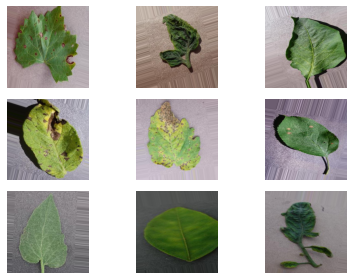

In [ ]:
 
for i in range(9):
    plt.subplot(3,3,i+1)
    for x,y in validGenerator:
        plt.imshow((x[0]/255))
        #plt.title('y={}'.format(y[0]))
        plt.axis('off')
        break
plt.tight_layout()
plt.show()

In [ ]:
def generate_plot_pics(datagen,orig_img):
    dir_augmented_data = "/content/showGeneratedImage"
    try:
        ## if the preview folder does not exist, create
        os.mkdir(dir_augmented_data)
    except:
        ## if the preview folder exists, then remove
        ## the contents (pictures) in the folder
        for item in os.listdir(dir_augmented_data):
            os.remove(dir_augmented_data + "/" + item)
 
    ## convert the original image to array
    x = img_to_array(orig_img)
    ## reshape (Sampke, Nrow, Ncol, 3) 3 = R, G or B
    x = x.reshape((1,) + x.shape)
    ## -------------------------- ##
    ## randomly generate pictures
    ## -------------------------- ##
    i = 0
    Nplot = 8
    for batch in datagen.flow(x,batch_size=1,
                          save_to_dir=dir_augmented_data,
                          save_prefix="pic",
                          save_format='jpeg'):
        i += 1
        if i > Nplot - 1: ## generate 8 pictures 
            break
 
    ## -------------------------- ##
    ##   plot the generated data
    ## -------------------------- ##
    fig = plt.figure(figsize=(8, 6))
    fig.subplots_adjust(hspace=0.02,wspace=0.01,
                    left=0,right=1,bottom=0, top=1)
 
    ## original picture
    ax = fig.add_subplot(3, 3, 1,xticks=[],yticks=[])        
    ax.imshow(orig_img)
    ax.set_title("original")
 
    i = 2
    for imgnm in os.listdir(dir_augmented_data):
        ax = fig.add_subplot(3, 3, i,xticks=[],yticks=[]) 
        img = load_img(dir_augmented_data + "/" + imgnm)
        ax.imshow(img)
        i += 1
    plt.show()

In [ ]:
 
ImageFiles = listdir('/content/Test/')
randomNum = random.randint(0,len(ImageFiles))
imgPath = f"/content/Test/{ImageFiles[randomNum]}"

In [ ]:
 from keras.preprocessing.image import load_img
import os

In [ ]:
 orig_img = image.load_img(imgPath)

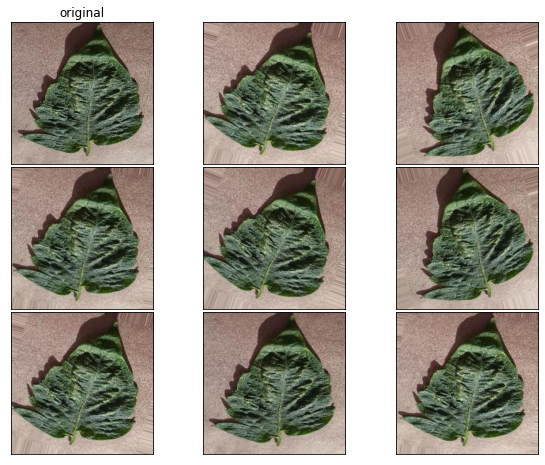

In [ ]:
 datagen = ImageDataGenerator(rotation_range=25)
generate_plot_pics(datagen,orig_img)

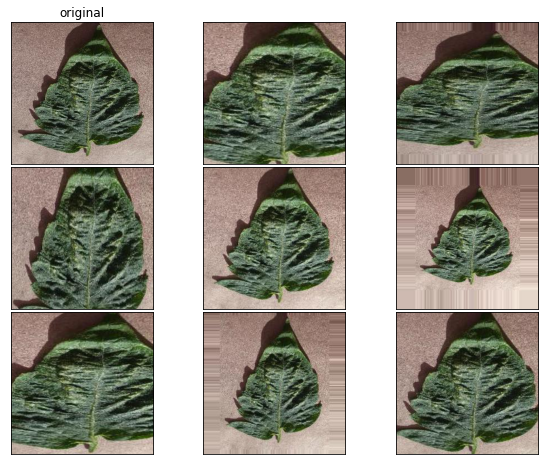

In [ ]:
  datagen = ImageDataGenerator(zoom_range=.5)
generate_plot_pics(datagen,orig_img)

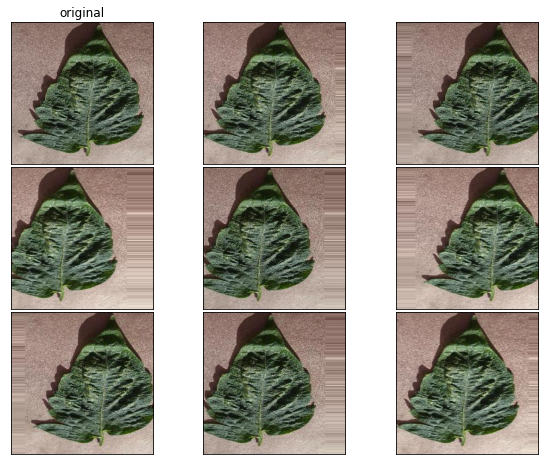

In [ ]:
  datagen = ImageDataGenerator(width_shift_range=0.2)
generate_plot_pics(datagen,orig_img)

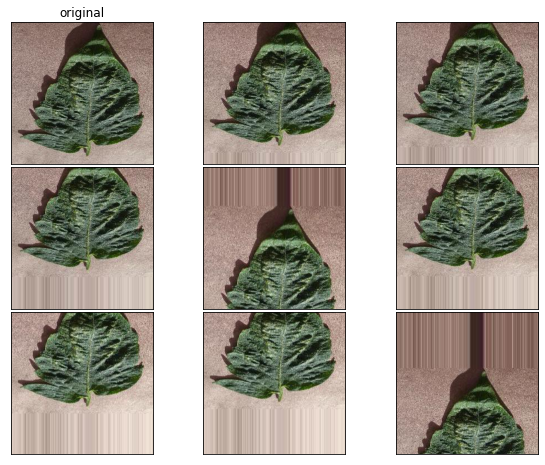

In [ ]:
  datagen = ImageDataGenerator(height_shift_range=0.4)
generate_plot_pics(datagen,orig_img)

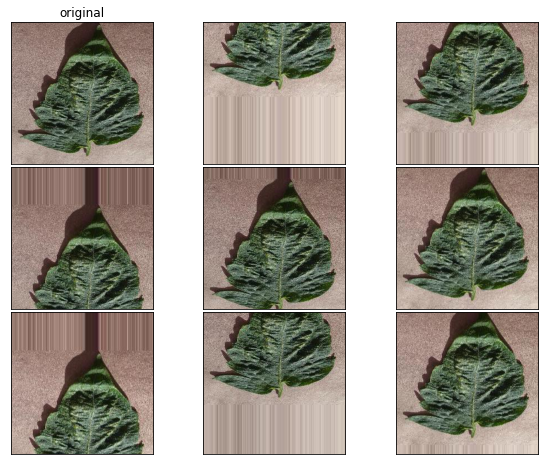

In [ ]:
 datagen = ImageDataGenerator(height_shift_range=0.5,fill_mode="nearest")
generate_plot_pics(datagen,orig_img)

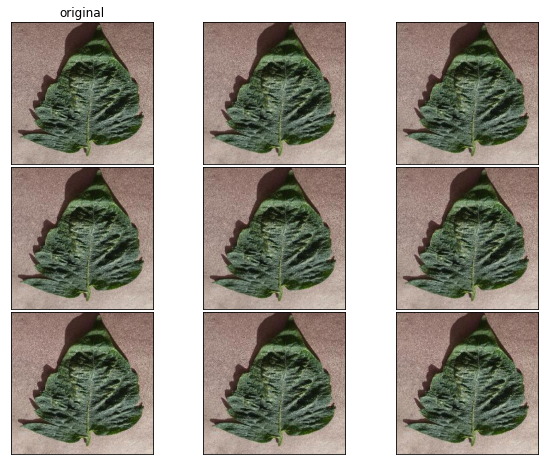

In [ ]:
  datagen = ImageDataGenerator(shear_range=1.5)
generate_plot_pics(datagen,orig_img)

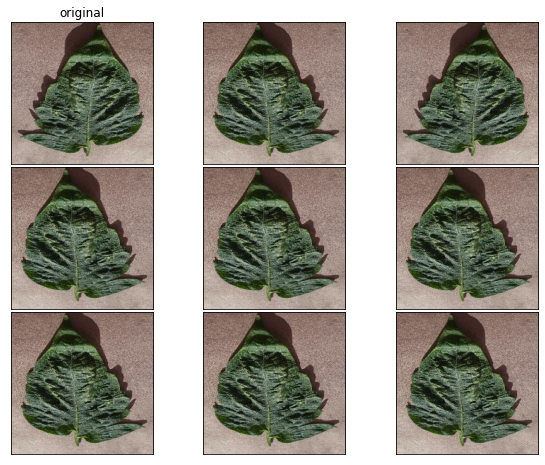

In [ ]:
  datagen = ImageDataGenerator(horizontal_flip=True)
generate_plot_pics(datagen,orig_img)

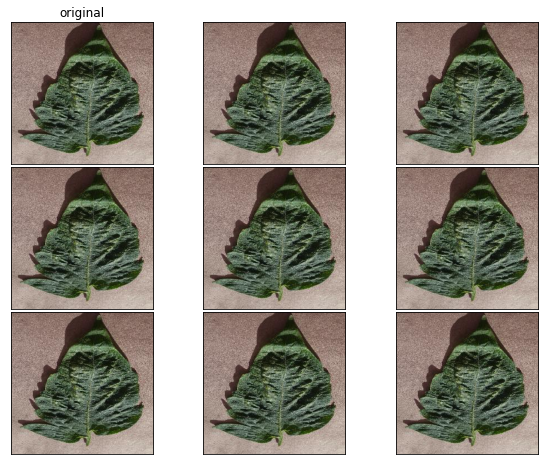

In [ ]:
  datagen = ImageDataGenerator(rescale=1./255)
generate_plot_pics(datagen,orig_img)

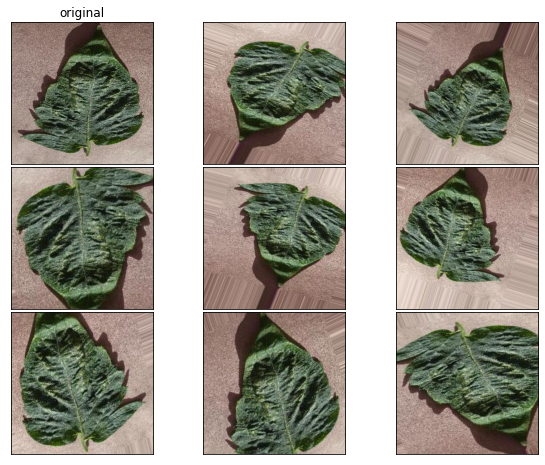

In [ ]:
datagen = ImageDataGenerator(rotation_range=25,horizontal_flip=True,fill_mode="nearest",shear_range=0.2,zoom_range=0.3,width_shift_range=0.1,height_shift_range=0.1,rescale=1./255,vertical_flip=True)
generate_plot_pics(datagen,orig_img)

In [47]:
model = Sequential()

In [48]:
 inputShape = (224,224,3)
chanDim = -1
if K.image_data_format() == "channels_first":
    inputShape = (depth, height, width)
    chanDim = 1
n_classes = 38
from keras.regularizers import l2

In [49]:
model.add(Conv2D(32, (3, 3), padding="same",name="conv_1",kernel_regularizer=l2(0.01), bias_regularizer=l2(0.01),input_shape=inputShape))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(MaxPooling2D(pool_size=(3, 3)))
model.add(Dropout(0.20))
model.add(Conv2D(64, (3, 3),kernel_regularizer=l2(0.01), bias_regularizer=l2(0.01),name="conv_2",padding="same"))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(Conv2D(64, (3, 3),kernel_regularizer=l2(0.01), bias_regularizer=l2(0.01),padding="same"))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.30))
model.add(Conv2D(128, (3, 3),kernel_regularizer=l2(0.01), bias_regularizer=l2(0.01),padding="same"))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(Conv2D(128, (3, 3),kernel_regularizer=l2(0.01), bias_regularizer=l2(0.01),padding="same"))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.40))
model.add(Flatten())
model.add(Dense(1024))
model.add(Activation("relu"))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(n_classes))
model.add(Activation("softmax"))

In [50]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_1 (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
activation_8 (Activation)    (None, 224, 224, 32)      0         
_________________________________________________________________
batch_normalization_7 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 74, 74, 32)        0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 74, 74, 64)        18496     
_________________________________________________________________
activation_9 (Activation)    (None, 74, 74, 64)       

In [51]:
 
for layer in model.layers:
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # get filter weights
    filters, biases = layer.get_weights()
    print(layer.name, filters.shape)

conv_1 (3, 3, 3, 32)
conv_2 (3, 3, 32, 64)
conv2d_4 (3, 3, 64, 64)
conv2d_5 (3, 3, 64, 128)
conv2d_6 (3, 3, 128, 128)


Conv0


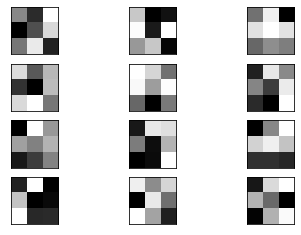

Conv5


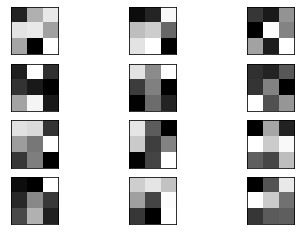

Conv8


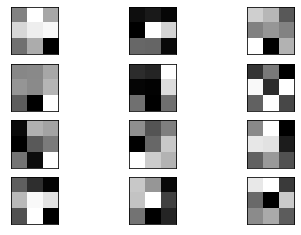

Conv13


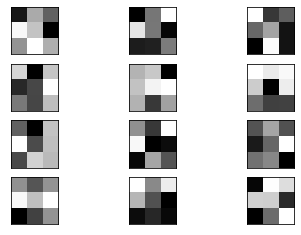

Conv16


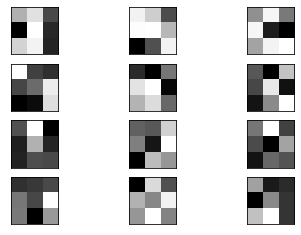

In [56]:
#print(model.layers[0].get_weights())
# retrieve weights from the second hidden layer
ConvLayerIndex = [0,5,8,13,16]
from matplotlib import pyplot
for j in ConvLayerIndex : 
    filters, biases = model.layers[j].get_weights()
    print("Conv"+str(j))
    # normalize filter values to 0-1 so we can visualize them
    f_min, f_max = filters.min(), filters.max()
    filters = (filters - f_min) / (f_max - f_min)
    
    # plot first few filters
    n_filters, ix = 4, 1
    for i in range(n_filters):
        # get the filter
        f = filters[:, :, :, i]
        # plot each channel separately
        for j in range(3):
            # specify subplot and turn of axis
            ax = pyplot.subplot(n_filters, 3, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            pyplot.imshow(f[:, :, j],cmap='gray')
            ix += 1
    # show the figure
    pyplot.show()

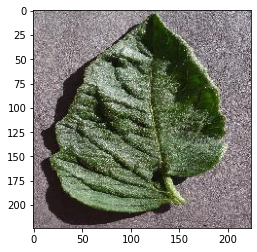

(1, 224, 224, 3)


In [106]:
ImageFiles = listdir('/content/Test/')
randomNum = random.randint(0,len(ImageFiles))
img_path = f"/content/Test/{ImageFiles[randomNum]}"
img = image.load_img(img_path, target_size=(224, 224))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255
plt.imshow(img_tensor[0])
plt.show()
print(img_tensor.shape)

In [107]:
from keras import models
layer_outputs = [layer.output for layer in model.layers[:12]] # Extracts the outputs of the top 12 layers
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [108]:
activations = activation_model.predict(img_tensor) #
print(len(activations))

12


(1, 74, 74, 64)


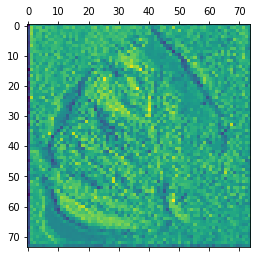

In [112]:
first_layer_activation = activations[5]
print(first_layer_activation.shape)
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

In [61]:
layer_names = []
print(len(model.layers))
print(len(activations))

28
12


['conv_1', 'activation_8', 'batch_normalization_7', 'max_pooling2d_4', 'dropout_5', 'conv_2', 'activation_9', 'batch_normalization_8', 'conv2d_4', 'activation_10', 'batch_normalization_9', 'max_pooling2d_5']


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


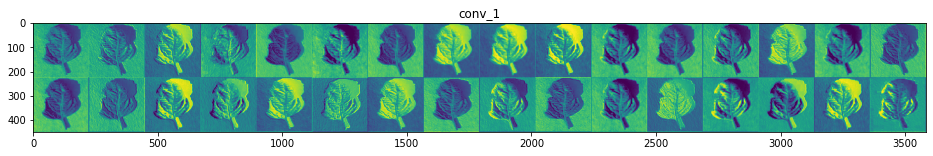

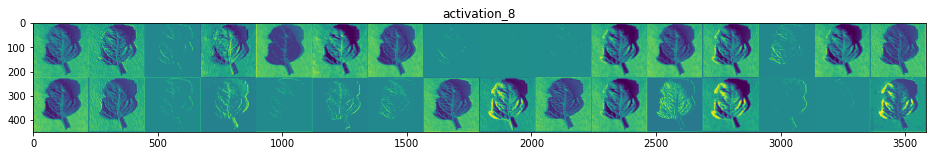

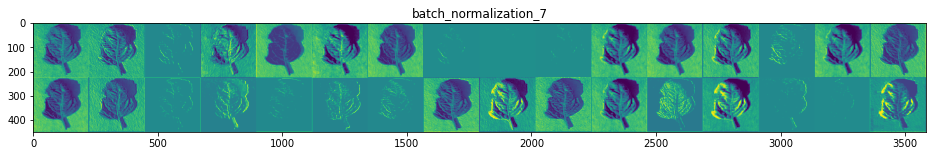

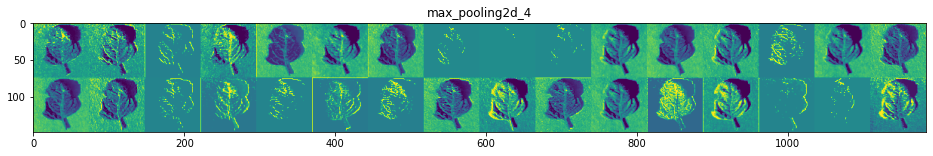

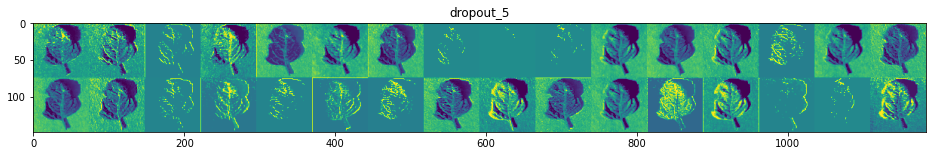

...

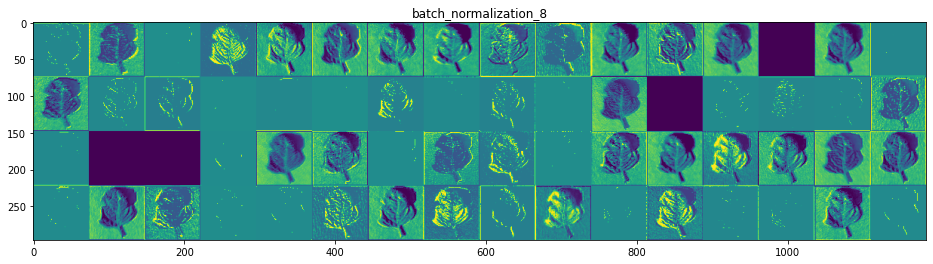

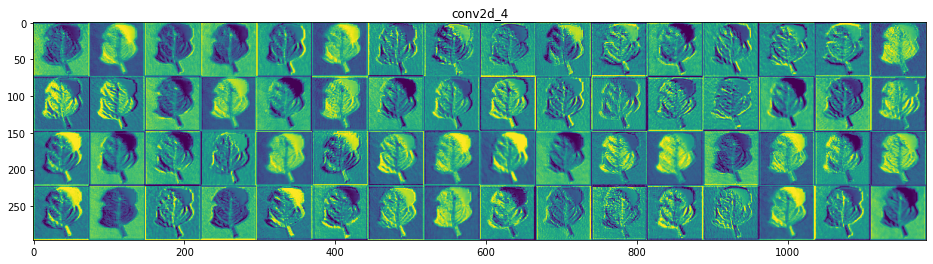

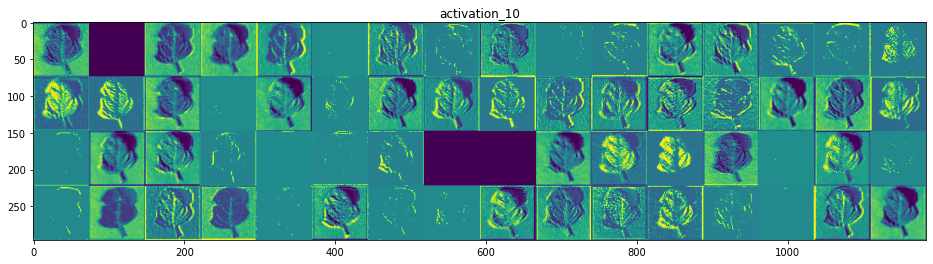

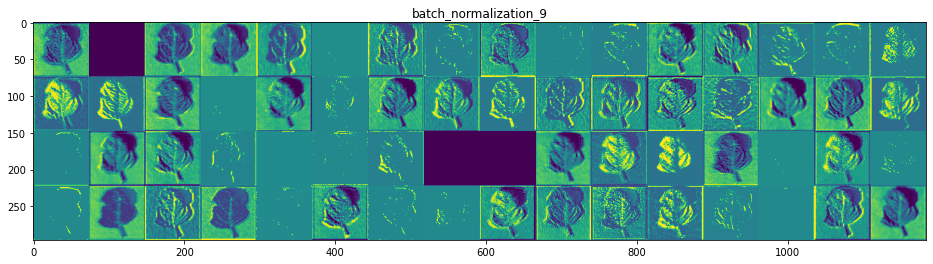

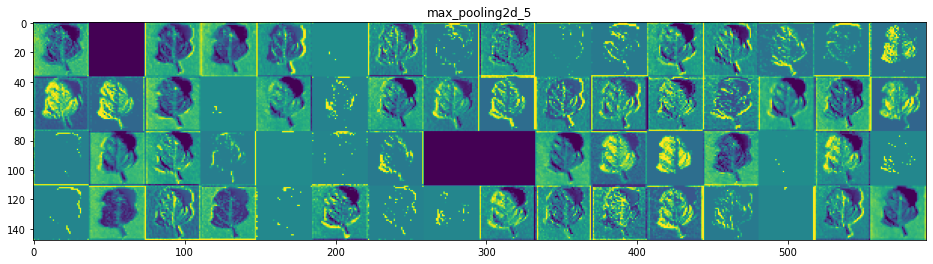

In [62]:
 for layer in model.layers[:12]:
    layer_names.append(layer.name)
print(layer_names) # Names of the layers, so you can have them as part of your plot   
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :,col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [113]:
layer_outputs = [layer.output for layer in model.layers[12:20]] # Extracts the outputs after 12 layers
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [116]:
activations = activation_model.predict(img_tensor) #
print(len(activations))

8


(1, 37, 37, 64)


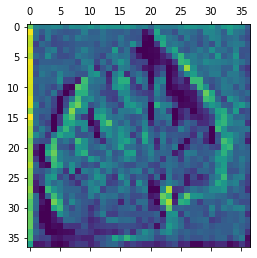

In [130]:
 first_layer_activation = activations[0] # 8,13,16
print(first_layer_activation.shape)
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

In [76]:
layer_names = []
print(len(model.layers))
print(len(activations))

28
8


['dropout_6', 'conv2d_5', 'activation_11', 'batch_normalization_10', 'conv2d_6', 'activation_12', 'batch_normalization_11', 'max_pooling2d_6']


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


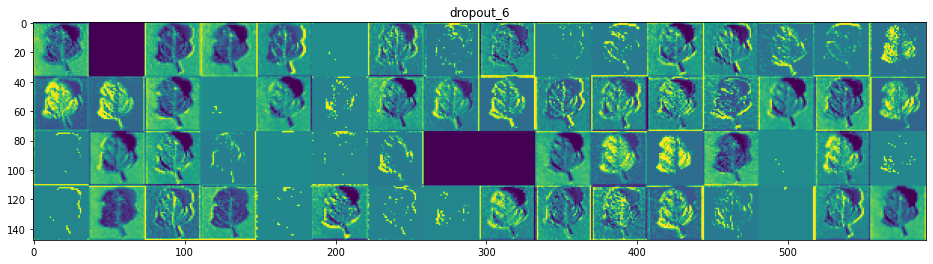

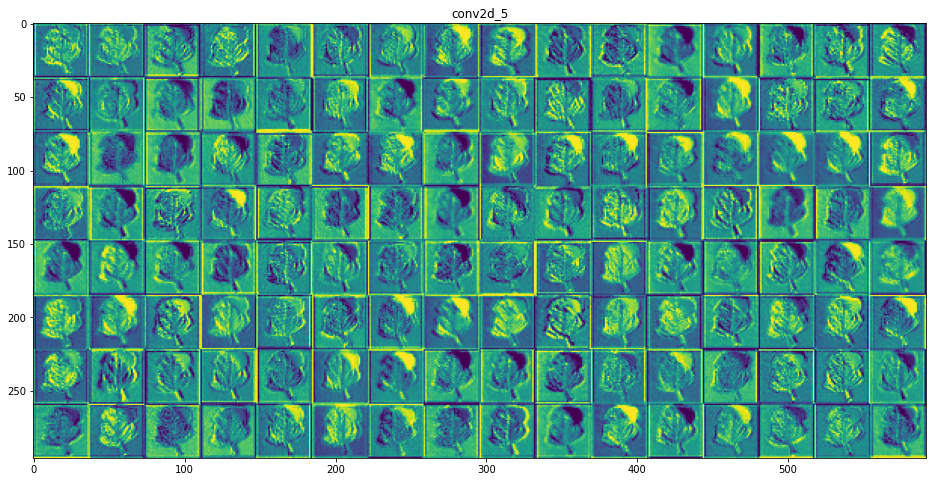

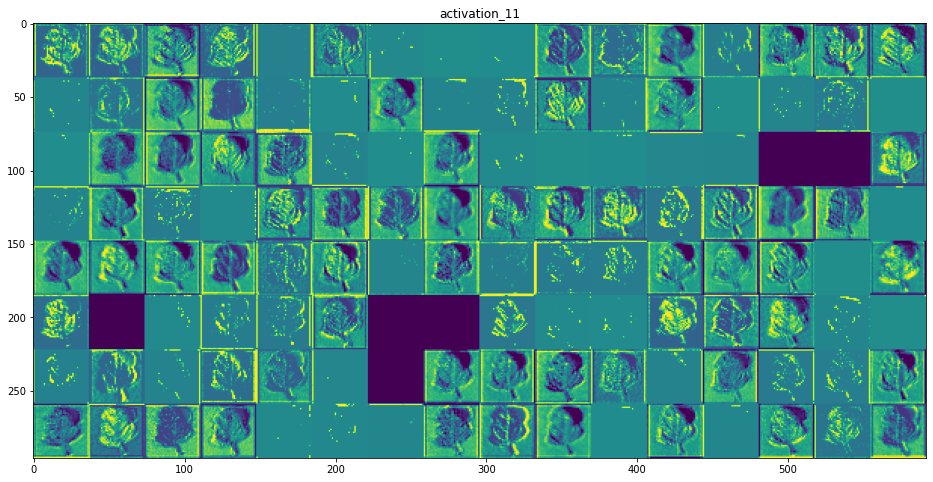

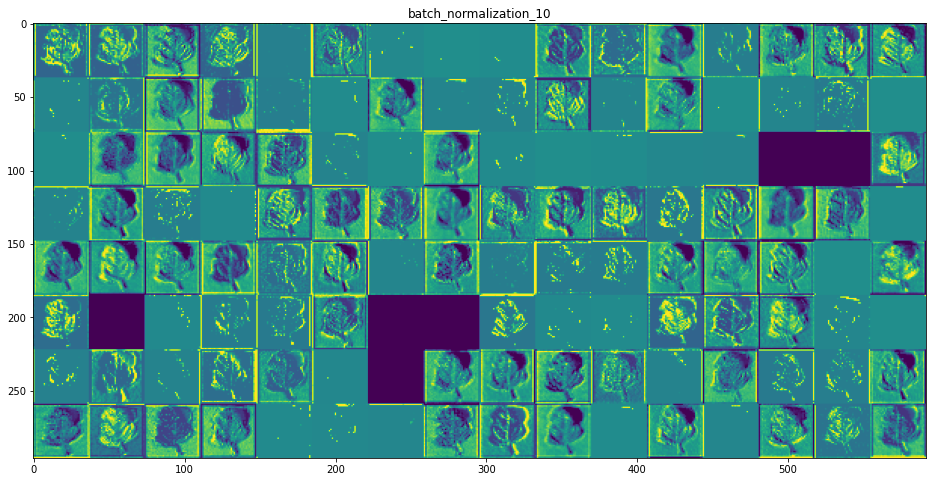

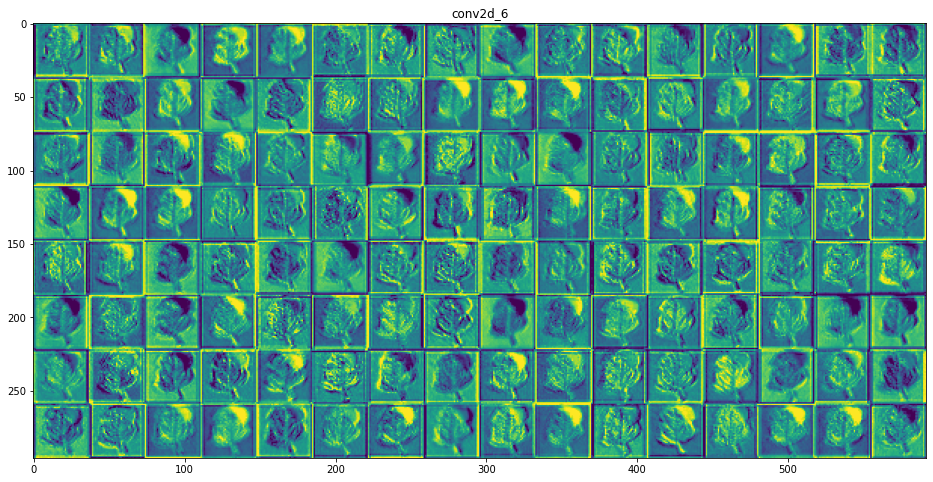

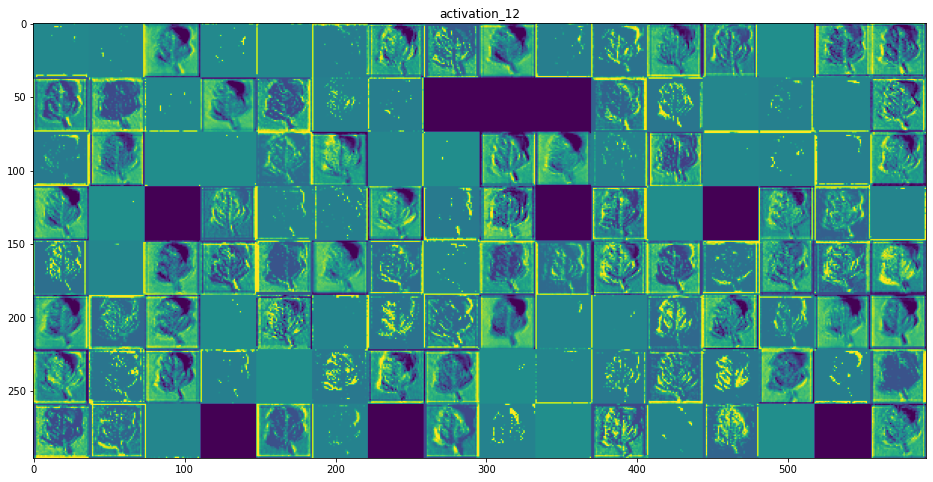

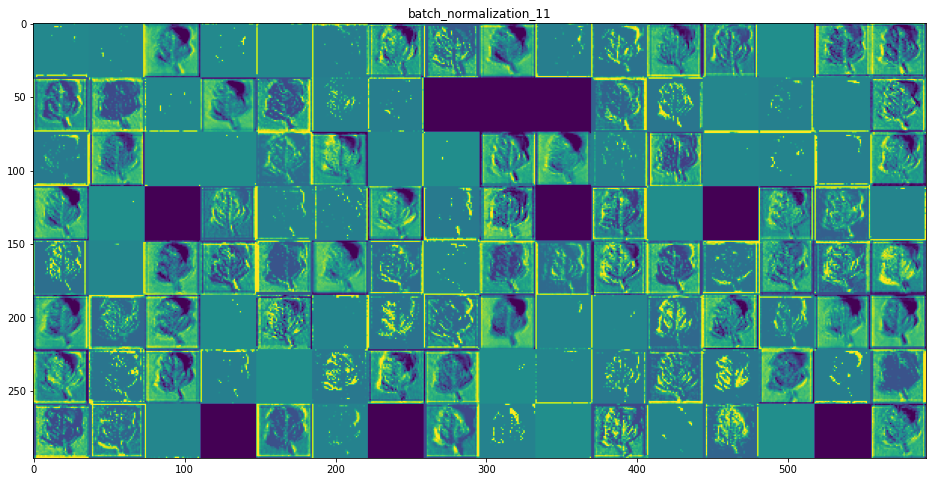

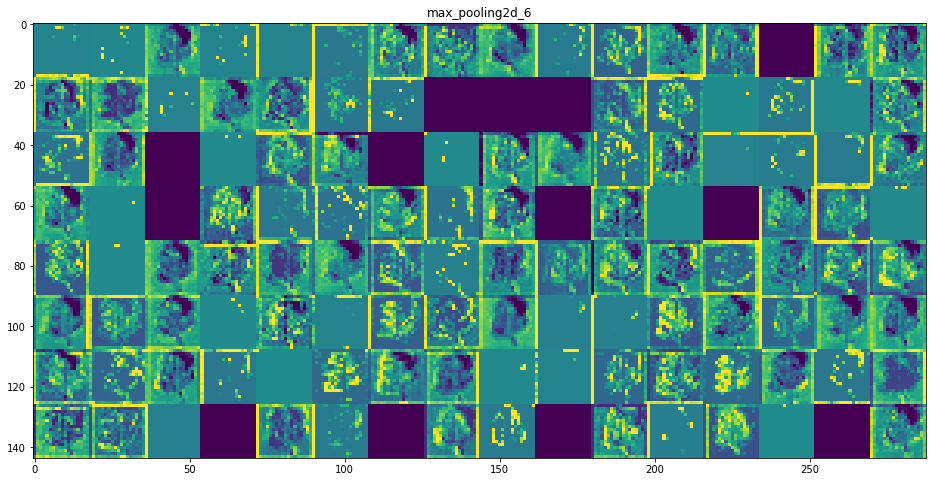

In [77]:
 for layer in model.layers[12:20]:
    layer_names.append(layer.name)
print(layer_names) # Names of the layers, so you can have them as part of your plot   
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :,col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

 
<h3>Flatten</h3>
<img src="https://missinglink.ai/wp-content/uploads/2019/04/Group-5-700x383.png"/>

<h3>Dense Layer</h3>
<img src="https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcSSxEkECdZYbtDNrGhzkvld4ACVW96CVoJThQ&usqp=CAU"/>